<a href="https://colab.research.google.com/github/mariavzunigar/nequip-allegro/blob/main/nnp_combined/Combined_NNP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
## INSTALL NEQUIP ##
!pip install nequip==0.7.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 7.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.4/182.4 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 448.0/448.0 kB 22.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 73.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 69.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.9 MB/s eta 0:00:00

In [1]:
## INSTALL PAIR NEQUIP ##
!git clone https://github.com/mir-group/pair_nequip_allegro.git

## INSTALL LAMMPS ##
!rm -rf /content/lammps
!git clone --depth=1 https://github.com/lammps/lammps

# patch lammps
!cd pair_nequip_allegro && bash patch_lammps.sh ../lammps/

# build lammps
!cd lammps && rm -rf build && mkdir build && cd build && cmake ../cmake -DCMAKE_PREFIX_PATH=`python -c 'import torch;print(torch.utils.cmake_prefix_path)'` -DMKL_INCLUDE_DIR=/tmp && make -j$(nproc)

Cloning into 'pair_nequip_allegro'...
remote: Enumerating objects: 538, done.
remote: Counting objects: 100% (256/256), done.
remote: Compressing objects: 100% (126/126), done.
remote: Total 538 (delta 172), reused 195 (delta 122), pack-reused 282 (from 1)
Receiving objects: 100% (538/538), 318.19 KiB | 1.28 MiB/s, done.
Resolving deltas: 100% (295/295), done.
Cloning into 'lammps'...
remote: Enumerating objects: 14400, done.
remote: Counting objects: 100% (14400/14400), done.
remote: Compressing objects: 100% (10349/10349), done.
remote: Total 14400 (delta 4973), reused 7906 (delta 3810), pack-reused 0 (from 0)
Receiving objects: 100% (14400/14400), 134.02 MiB | 22.66 MiB/s, done.
Resolving deltas: 100% (4973/4973), done.
Updating files: 100% (13736/13736), done.
Copying files...
Updating CMakeLists.txt...
Done!
CMake Deprecation Warning at CMakeLists.txt:21 (cmake_policy):
  The OLD behavior for policy CMP0109 will be removed from a future version
  of CMake.

  The cmake-policies(7)

In [2]:
## DOWNLOADING THE TRAINING DATA AND CONFIG FILE ##
!wget https://raw.githubusercontent.com/mariavzunigar/nequip-allegro/refs/heads/main/nnp_combined/config_agocl_1016.yaml
!wget https://raw.githubusercontent.com/mariavzunigar/nequip-allegro/refs/heads/main/nnp_combined/combined_xyz_1016.xyz

--2025-05-08 15:33:21--  https://raw.githubusercontent.com/mariavzunigar/nequip-allegro/refs/heads/main/nnp_combined/config_agocl_1016.yaml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12789 (12K) [text/plain]
Saving to: ‘config_agocl_1016.yaml’

config_agocl_1016.y 100%[===================>]  12.49K  --.-KB/s    in 0s      

2025-05-08 15:33:21 (71.2 MB/s) - ‘config_agocl_1016.yaml’ saved [12789/12789]

--2025-05-08 15:33:22--  https://raw.githubusercontent.com/mariavzunigar/nequip-allegro/refs/heads/main/nnp_combined/combined_xyz_1016.xyz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... conn

In [3]:
## TRAIN NEQUIP ##
!rm -rf ./results
!mkdir ./results
!nequip-train -cn config_agocl_1016.yaml

[2025-05-08 15:33:57,319][nequip.utils.versions][INFO] - [rank: 0] Version Information:
[2025-05-08 15:33:57,320][nequip.utils.versions][INFO] - [rank: 0] torch 2.6.0+cu124
[2025-05-08 15:33:57,320][nequip.utils.versions][INFO] - [rank: 0] e3nn 0.5.6
[2025-05-08 15:33:57,320][nequip.utils.versions][INFO] - [rank: 0] nequip 0.7.0
[2025-05-08 15:33:57,320][nequip.scripts.train][INFO] - [rank: 0] This `nequip-train` run will perform the following tasks: ['train', 'test']
[2025-05-08 15:33:57,320][nequip.scripts.train][INFO] - [rank: 0] and use the output directory provided by Hydra: /content/outputs/2025-05-08/15-33-57
[2025-05-08 15:33:57,343][nequip.scripts.train][INFO] - [rank: 0] Building datamodule ...
[2025-05-08 15:33:57,352][nequip.data.datamodule._base_datamodule][INFO] - [rank: 0] Found 1 training dataset(s), 1 validation dataset(s), 1 test dataset(s), and 0 predict dataset(s).
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, 

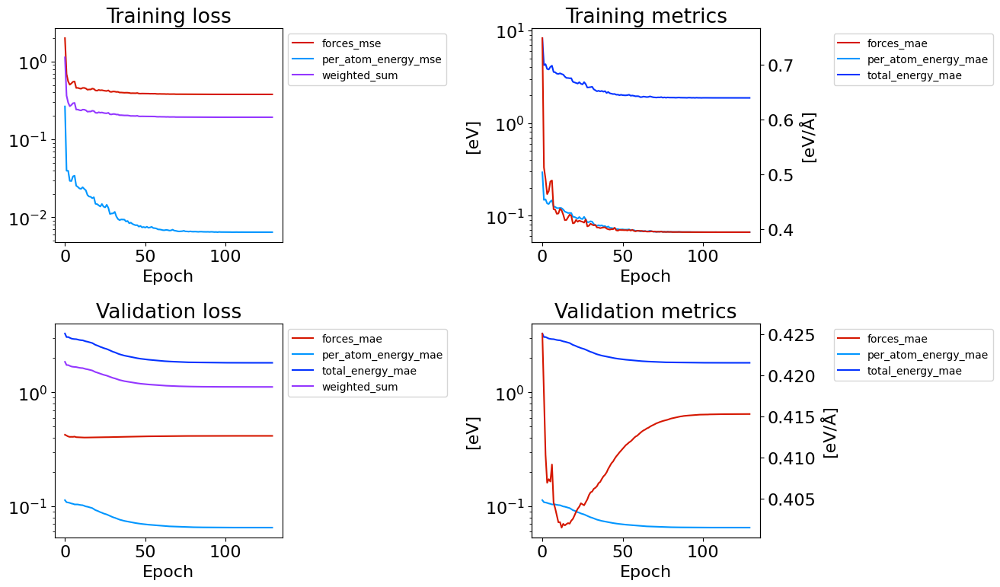

In [4]:
# @title Plotting training metrics
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 16})
from typing import Literal

colors_dict = {
    "forces_mae": "#d51700",
    "forces_mse": "#d51700",
    # "forces_rmse": "#9437ff",
    "per_atom_energy_mae": "#0096ff",
    "per_atom_energy_mse": "#0096ff",
    # "per_atom_energy_rmse": "#0096ff",
    "total_energy_mae": "#0433ff",
    "total_energy_mse": "#0433ff",
    # "total_energy_rmse": "red",
    "weighted_sum": "#9437ff",
}

def get_metrics(df,
                group: Literal["train", "val"] = "train",
                type: Literal["loss", "metric"] = "metric"):

    if group == "train":
        column_names = [column for column in df.columns if
                        all(["epoch" in column, group in column, type in column])]
    else:
        column_names = [column for column in df.columns if
                        all(["epoch" in column, group in column])]
    columns_to_keep = ["epoch"] + column_names
    df = df[columns_to_keep]
    df = df.dropna(axis=0, subset=column_names)
    renamed_columns = {column: column.split("/")[-1] for column in column_names}
    df = df.rename(columns=renamed_columns)
    return df, renamed_columns.values()

def plot_metric_in_ax(ax, df,
                 group: Literal["train", "val"] = "train",
                 type: Literal["loss", "metric"] = "metric"):
    group_names={"train": "Training", "val": "Validation", "test": "Testing"}
    type_names={"loss": "loss", "metric": "metrics"}
    df, metric_names= get_metrics(df, group=group, type=type)
    lines, labels = [], []
    if type=="metric":
      ax2 = ax.twinx()
      legend_x = 1.3
      for metric in metric_names:
        label = metric.split("/")[0]
        if label not in colors_dict:
          continue
        if "weighted" in metric:
          continue
        if "force" in metric:
          line, = ax2.plot(df["epoch"], df[metric], color=colors_dict[label])
        else:
          line, = ax.plot(df["epoch"], df[metric], color=colors_dict[label])
        lines.append(line)
        labels.append(label)
      ax.set_ylabel("[eV]")
      ax2.set_ylabel("[eV/Å]")
    else:
      legend_x = 1.0
      for metric in metric_names:
        label = metric.split("/")[0]
        if label not in colors_dict:
          continue
        line, = ax.plot(df["epoch"], df[metric], color=colors_dict[label])
        lines.append(line)
        labels.append(label)
    ax.legend(lines, labels, bbox_to_anchor=(legend_x, 1), loc='upper left', fontsize=10)

    # log axis:
    ax.set_yscale("log")
    ax.set_xlabel("Epoch")
    # ax.set_ylabel(f"{group_names[group]} {type_names[type]}")
    ax.set_title(f"{group_names[group]} {type_names[type]}")

def plot_metrics(df):
    fig, ax = plt.subplots(2, 2, figsize=(14, 8))
    plot_metric_in_ax(ax[0,0], df, group='train', type="loss")
    plot_metric_in_ax(ax[0,1], df, group='train', type="metric")
    plot_metric_in_ax(ax[1,0], df, group='val', type="loss")
    plot_metric_in_ax(ax[1,1], df, group='val', type="metric")
    plt.tight_layout()
    plt.show()

metrics_path = "/content/results/AgClO_log/version_0/metrics.csv"
metrics_df = pd.read_csv(metrics_path)

plot_metrics(metrics_df)

In [5]:
ckpt_path = "/content/results/best.ckpt"
output_path = "/content/deployed.nequip.pth"

!nequip-compile --mode torchscript --input-path {ckpt_path} --output-path {output_path} --device cuda

[2025-05-08 16:26:18,252][nequip.scripts.compile][INFO] - [rank: 0] Compiling for device: cuda
[2025-05-08 16:26:18,253][nequip.scripts.compile][INFO] - [rank: 0] Loading model for compilation from /content/results/best.ckpt ...
[2025-05-08 16:26:18,253][nequip.model.from_save][INFO] - [rank: 0] Loading model from checkpoint file: /content/results/best.ckpt ...
[2025-05-08 16:26:19,051][nequip.train.ema][INFO] - [rank: 0] Loading EMA weights for evaluation model.
[2025-05-08 16:26:20,536][nequip.scripts.compile][INFO] - [rank: 0] TorchScript model saved to /content/deployed.nequip.pth


In [7]:
!wget https://raw.githubusercontent.com/mariavzunigar/nequip-allegro/refs/heads/main/nnp_combined/ag100_37o_36_cl.xyz

--2025-05-08 16:39:12--  https://raw.githubusercontent.com/mariavzunigar/nequip-allegro/refs/heads/main/nnp_combined/ag100_37o_36_cl.xyz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 8870 (8.7K) [text/plain]
Saving to: ‘ag100_37o_36_cl.xyz.1’

ag100_37o_36_cl.xyz 100%[===================>]   8.66K  --.-KB/s    in 0s      

2025-05-08 16:39:12 (44.0 MB/s) - ‘ag100_37o_36_cl.xyz.1’ saved [8870/8870]



In [8]:
!ls

ag100_37o_36_cl.xyz    config_agocl_1016.yaml  outputs		    sample_data
ag100_37o_36_cl.xyz.1  deployed.nequip.pth     pair_nequip_allegro
combined_xyz_1016.xyz  lammps		       results


In [13]:
# @title Prepare files and run LAMMPS
from ase.io import read, write
example_atoms = read('/content/ag100_37o_36_cl.xyz', index=0)
write('./agocldata.data', example_atoms, format='lammps-data')

lammps_input = """
units metal
atom_style atomic
dimension 3

# set newton on for pair_allegro (off for pair_nequip)
newton off
boundary p p p
read_data ../agocldata.data

# if you want to run a larger system, simply replicate the system in space
# replicate 3 3 3

# allegro pair style
pair_style nequip
pair_coeff * * /content/deployed.nequip.pth Ag O Cl

# Define masses
mass 1 107.87  # Silver (Ag)
mass 2 16.00   # Oxygen (O)
mass 3 35.45   # Chlorine (Cl)

velocity all create 300.0 1234567 loop geom

neighbor 1.0 bin
neigh_modify delay 1 every 1 check yes

timestep 0.0005
thermo 10

dump dump_pos all custom 200 dump.xyz id type x y z

# Gradual temperature increase using Nose-Hoover thermostat
# Pre-equilibration step to stabilize the system
fix 1 all nvt temp 300 400 1.0
run 5000

# Gradually increase temperature to 523 K
fix 1 all nvt temp 400 523 1.0
run 10000

# Final production run at 523 K
fix 1 all nvt temp 523 523 1.0

# compute rdf and average after some equilibration
comm_modify cutoff 7.0
compute rdfall all rdf 1000 cutoff 5.0
fix 2 all ave/time 1 2500 5000 c_rdfall[*] file agocl.rdf mode vector

# run 5ps
run 5000
"""
!rm -rf ./lammps_run
!mkdir lammps_run
with open("lammps_run/agocl_rdf.in", "w") as f:
    f.write(lammps_input)

!cd lammps_run/ && ../lammps/build/lmp -in agocl_rdf.in


LAMMPS (2 Apr 2025 - Development - 3215141-modified)
OMP_NUM_THREADS environment is not set. Defaulting to 1 thread. (src/comm.cpp:99)
  using 1 OpenMP thread(s) per MPI task
Reading data file ...
  orthogonal box = (0 0 0) to (40.1 40.1 40.1)
  1 by 1 by 1 MPI processor grid
  reading atoms ...
  173 atoms
  read_data CPU = 0.001 seconds
NequIP/Allegro is using input precision d and output precision d
NequIP/Allegro: Loading model from /content/deployed.nequip.pth
NequIP/Allegro: Freezing TorchScript model...
Type mapping:
NequIP/Allegro type | NequIP/Allegro name | LAMMPS type | LAMMPS name
0 | Ag | 1 | Ag
1 | Cl | 3 | Cl
2 | O | 2 | O
Neighbor list info ...
  update: every = 1 steps, delay = 1 steps, check = yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 6
  ghost atom cutoff = 6
  binsize = 3, bins = 14 14 14
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair nequip, perpetual
      attributes: full, newton off, ghost
      pair bui

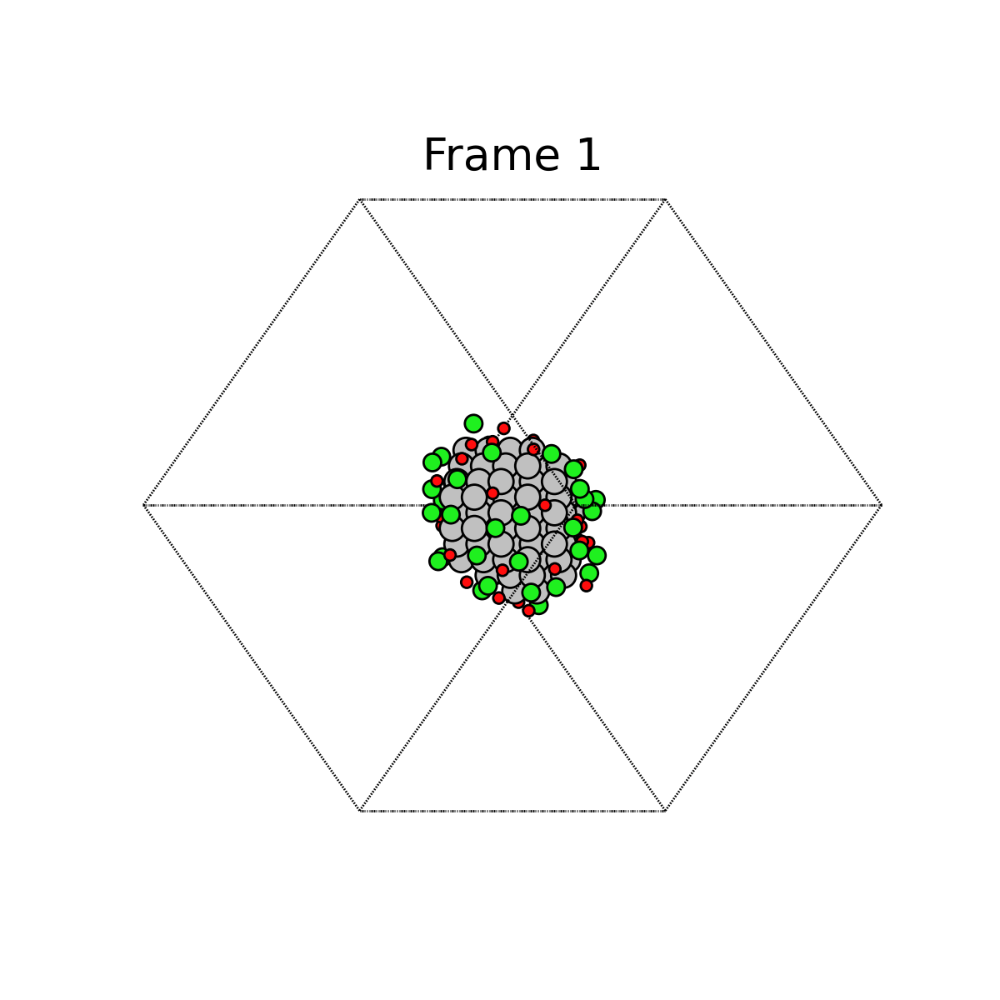

In [16]:
# @title Plotting trajectory animation for Ag O Cl system
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from ase.io import read
from ase.visualize.plot import plot_atoms
from IPython.display import Image

# Path to your uploaded .xyz file
xyz_file = '/content/lammps_run/dump.xyz'

# Read all frames from the .xyz file
atoms_list = read(xyz_file, index=":")

# Automatically detect the number of atoms in the first frame
num_atoms = len(atoms_list[0])

# Manually specify the atom distribution based on your system
# Adjust these numbers to match your system configuration
num_ag = 100  # Adjust if different
num_o = 37   # Adjust if different
num_cl = 36   # Adjust if different

# Ensure the sum matches the actual number of atoms
if num_ag + num_o + num_cl != num_atoms:
    raise ValueError("Sum of specified atom counts does not match the number of atoms in the system.")

# Set the chemical symbols for each atom in the list
atom_types = ['Ag'] * num_ag + ['O'] * num_o + ['Cl'] * num_cl

for atoms in atoms_list:
    atoms.set_chemical_symbols(atom_types)

# Create a figure for the animation
fig, ax = plt.subplots(figsize=(6, 6))

def update(frame):
    """Update function for animation."""
    ax.clear()
    plot_atoms(atoms_list[frame], ax, radii=0.8, rotation=('45x, 45y, 0z'))
    ax.set_title(f"Frame {frame + 1}")
    ax.axis("off")
plt.close()

# Create the animation
ani = FuncAnimation(fig, update, frames=len(atoms_list), interval=200)

# Save the animation as a GIF
ani.save("/content/ani.gif", writer="pillow", dpi=200, fps=60)

# Display the generated GIF
Image(open('/content/ani.gif', 'rb').read())


In [17]:
# @title Prepare files and run LAMMPS
from ase.io import read, write
example_atoms = read('/content/ag100_37o_36_cl.xyz', index=0)
write('./agocldata.data', example_atoms, format='lammps-data')

lammps_input = """
units metal
atom_style atomic
dimension 3

# set newton on for pair_allegro (off for pair_nequip)
newton off
boundary p p p
read_data ../agocldata.data

# if you want to run a larger system, simply replicate the system in space
# replicate 3 3 3

# allegro pair style
pair_style nequip
pair_coeff * * /content/deployed.nequip.pth Ag O Cl

# Define masses
mass 1 107.87  # Silver (Ag)
mass 2 16.00   # Oxygen (O)
mass 3 35.45   # Chlorine (Cl)

velocity all create 100.0 1234567 loop geom

neighbor 1.0 bin
neigh_modify delay 1 every 1 check yes

timestep 0.0005
thermo 10

dump dump_pos all custom 200 dump.xyz id type x y z

# Gradual temperature increase using Nose-Hoover thermostat
# Pre-equilibration step to stabilize the system
fix 1 all nvt temp 100 300 1.0
run 2500

# Gradually increase temperature to 523 K
fix 1 all nvt temp 300 523 1.0
run 5000

# Final production run at 523 K
fix 1 all nvt temp 523 523 1.0

# compute rdf and average after some equilibration
comm_modify cutoff 7.0
compute rdfall all rdf 1000 cutoff 5.0
fix 2 all ave/time 1 2500 5000 c_rdfall[*] file agocl.rdf mode vector

# run 5ps
run 5000
"""
!rm -rf ./lammps_run
!mkdir lammps_run
with open("lammps_run/agocl_rdf.in", "w") as f:
    f.write(lammps_input)

!cd lammps_run/ && ../lammps/build/lmp -in agocl_rdf.in


LAMMPS (2 Apr 2025 - Development - 3215141-modified)
OMP_NUM_THREADS environment is not set. Defaulting to 1 thread. (src/comm.cpp:99)
  using 1 OpenMP thread(s) per MPI task
Reading data file ...
  orthogonal box = (0 0 0) to (40.1 40.1 40.1)
  1 by 1 by 1 MPI processor grid
  reading atoms ...
  173 atoms
  read_data CPU = 0.001 seconds
NequIP/Allegro is using input precision d and output precision d
NequIP/Allegro: Loading model from /content/deployed.nequip.pth
NequIP/Allegro: Freezing TorchScript model...
Type mapping:
NequIP/Allegro type | NequIP/Allegro name | LAMMPS type | LAMMPS name
0 | Ag | 1 | Ag
1 | Cl | 3 | Cl
2 | O | 2 | O
Neighbor list info ...
  update: every = 1 steps, delay = 1 steps, check = yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 6
  ghost atom cutoff = 6
  binsize = 3, bins = 14 14 14
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair nequip, perpetual
      attributes: full, newton off, ghost
      pair bui

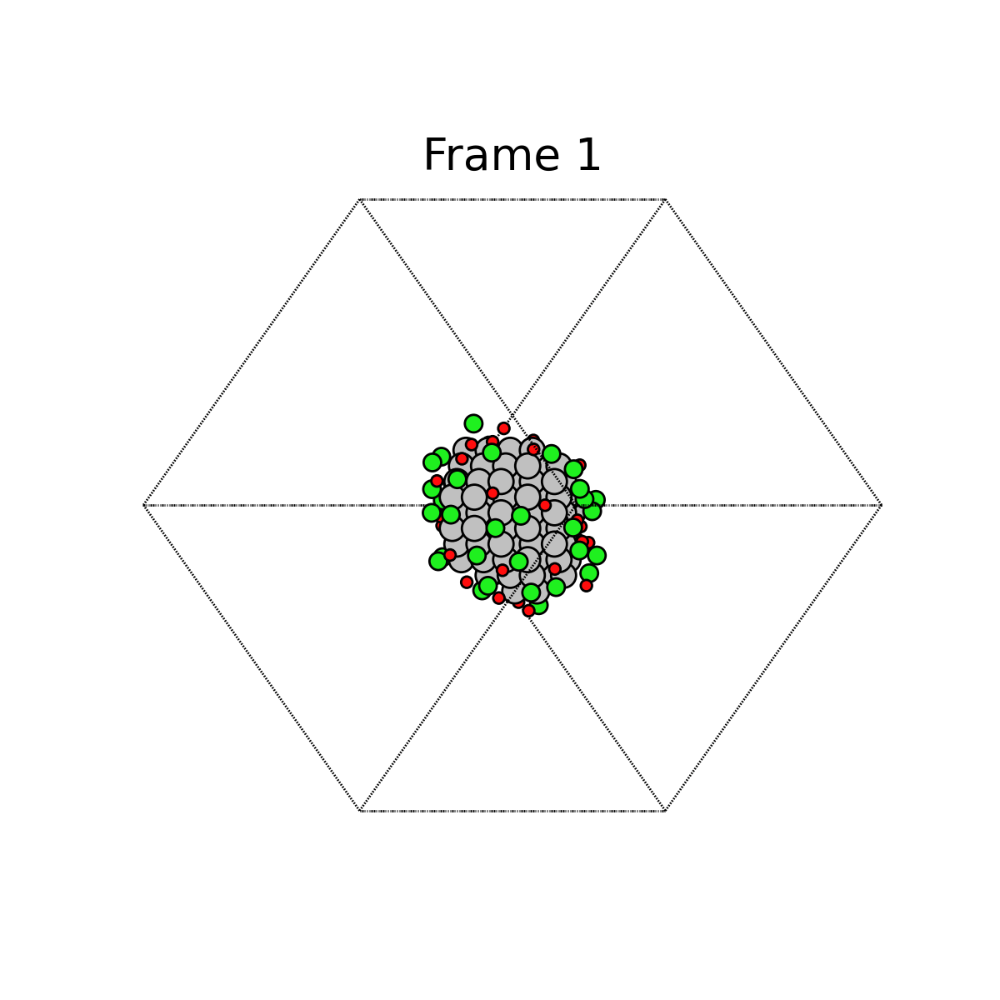

In [18]:
# @title Plotting trajectory animation for Ag O Cl system
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from ase.io import read
from ase.visualize.plot import plot_atoms
from IPython.display import Image

# Path to your uploaded .xyz file
xyz_file = '/content/lammps_run/dump.xyz'

# Read all frames from the .xyz file
atoms_list = read(xyz_file, index=":")

# Automatically detect the number of atoms in the first frame
num_atoms = len(atoms_list[0])

# Manually specify the atom distribution based on your system
# Adjust these numbers to match your system configuration
num_ag = 100  # Adjust if different
num_o = 37   # Adjust if different
num_cl = 36   # Adjust if different

# Ensure the sum matches the actual number of atoms
if num_ag + num_o + num_cl != num_atoms:
    raise ValueError("Sum of specified atom counts does not match the number of atoms in the system.")

# Set the chemical symbols for each atom in the list
atom_types = ['Ag'] * num_ag + ['O'] * num_o + ['Cl'] * num_cl

for atoms in atoms_list:
    atoms.set_chemical_symbols(atom_types)

# Create a figure for the animation
fig, ax = plt.subplots(figsize=(6, 6))

def update(frame):
    """Update function for animation."""
    ax.clear()
    plot_atoms(atoms_list[frame], ax, radii=0.8, rotation=('45x, 45y, 0z'))
    ax.set_title(f"Frame {frame + 1}")
    ax.axis("off")
plt.close()

# Create the animation
ani = FuncAnimation(fig, update, frames=len(atoms_list), interval=200)

# Save the animation as a GIF
ani.save("/content/ani.gif", writer="pillow", dpi=200, fps=60)

# Display the generated GIF
Image(open('/content/ani.gif', 'rb').read())
